# What's Cooking

**Kaggle Competition:** What's Cooking

**Kaggle Team Name:** Tejas_and_Shivam

## Goal
[What's cooking?](https://www.kaggle.com/c/whats-cooking) - cooking ingredients to classify the type of cuisine.


## <u>IMPORTANT NOTE:</u> Please ensure that at least 4 IPython Clusters are running before executing the code below

In [ ]:
# Starting Clusters (in Windows)
!ipcluster start -n 4

In [1]:
%matplotlib inline
import IPython.core.display         
# setup output image format (Chrome works best)
IPython.core.display.set_matplotlib_formats("svg")
import matplotlib.pyplot as plt
import matplotlib
from numpy import *
from sklearn import *
from scipy import stats
import IPython.utils.warn as warn
random.seed(100)
import json
import csv
import pickle     
from IPython import parallel

C:\Users\admin\AppData\Roaming\Python\Python27\site-packages\sklearn\lda.py:4: DeprecationWarning: lda.LDA has been moved to discriminant_analysis.LinearDiscriminantAnalysis in 0.17 and will be removed in 0.19
  "in 0.17 and will be removed in 0.19", DeprecationWarning)
C:\Users\admin\AppData\Roaming\Python\Python27\site-packages\sklearn\qda.py:4: DeprecationWarning: qda.QDA has been moved to discriminant_analysis.QuadraticDiscriminantAnalysis in 0.17 and will be removed in 0.19.
  "in 0.17 and will be removed in 0.19.", DeprecationWarning)


In [2]:
%%px 
# load libraries on clusters
from numpy import *
from sklearn import *
from pickle import *

ERROR: Cell magic `%%px` not found.


In [ ]:
# load the client interface
from IPython import parallel

clients = parallel.Client()
clients.block = True   # wait for calculations to finish
print clients.ids      # client process ids

In [ ]:
# get the load-balanced scheduler
lview = clients.load_balanced_view()


# Loading the training and the testing data


In [ ]:
def load_cooking(fname):
    # load the cooking dataset
    # returns dictionary with data, target (cuisine type), item ids
    
    fp = open(fname, "r")
    dataj = json.load(fp)
    fp.close()
    
    data = []
    ids  = []
    target = []
    for o in dataj:
        if o.has_key('cuisine'):
            target.append(o['cuisine'])
        ids.append(o['id'])
        data.append(o['ingredients'])

    out = {"data": data, "id":ids}
    if len(target) > 0:
        out["target"] =  target
    return out


# write a kaggle submission file for "whats cooking"
def write_csv_kaggle_cooking(fname, ids, target):
    # header
    tmp = [['id', 'cuisine']]
    
    for i in range(len(ids)):
        # add a row (id and class prediction)
        tmp.append([ids[i], target[i]])
        
    # write CSV file
    f = open(fname, 'wb')
    writer = csv.writer(f)
    writer.writerows(tmp)
    f.close()

In [85]:
# load the data
traindata = load_cooking("whats cooking/train.json")
testdata  = load_cooking("whats cooking/test.json")
print len(traindata['data'])
print len(testdata['data'])

39774
9944


In [86]:
# first training example
print traindata['data'][1]
# data is a list of ingredients
print traindata['target'][1]
# target is the cuisine

[u'plain flour', u'ground pepper', u'salt', u'tomatoes', u'ground black pepper', u'thyme', u'eggs', u'green tomatoes', u'yellow corn meal', u'milk', u'vegetable oil']
southern_us


In [87]:
# list of cuisines
classes = unique(traindata['target'])
print classes

[u'brazilian' u'british' u'cajun_creole' u'chinese' u'filipino' u'french'
 u'greek' u'indian' u'irish' u'italian' u'jamaican' u'japanese' u'korean'
 u'mexican' u'moroccan' u'russian' u'southern_us' u'spanish' u'thai'
 u'vietnamese']


# Data Exploration
- Before we start, let's explore the data, and look at the distribution of cuisines and ingredients

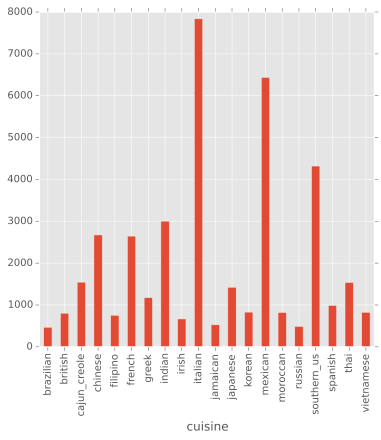

In [88]:
#Read the JSON input file into dataframe
import pandas as pd

train = pd.read_json('whats cooking/train.json')
#Get the most frequent occurring item occurring in each cuisine

#Get the different cusinies
groups = train.groupby(train.cuisine).size()
matplotlib.style.use('ggplot')
groups.plot(kind='bar', figsize=(6, 6))


#Data Pre processing

### Methods used:
 ####- Punctuation removal:
     - Removal of [ , . / \ ; ( ) ? ! ] < >
 ####- Word Stemming: 
      - For grammatical reasons, documents are going to use different forms of a word, such as organize, organizes, and organizing. Additionally, there are families of derivationally related words with similar meanings, such as democracy, democratic, and democratization. In many situations, it seems as if it would be useful for a search for one of these words to return documents that contain another word in the set.
      - Stemming usually refers to a crude heuristic process that chops off the ends of words in the hope of achieving this goal correctly most of the time, and often includes the removal of derivational affixes.
      - The most common algorithm for stemming English, and one that has repeatedly been shown to be empirically very effective, is Porter's algorithm. For this assignment as well, the PorterStemmer implementation has been used from Python's nltk library (Natural Language Tool Kit).
 ####- Lower Casing: 
    - So as to avoid anamolies that occur due to a word having different cases in the document, the entire train/test text has to be converted to lowercase.

In [7]:
print len(traindata['data'])
print len(testdata['data'])

39774
9944


In [8]:
#Our preprocessing function will append 
import re
from nltk.stem import WordNetLemmatizer
def PreProcess(list1):
    from nltk.stem.porter import *
    cleaned_record = []
    for i,value in enumerate(list1):
        # Replacing punctuation chars with space
        clean_txt= value.replace(',',' ').replace('.',' ').replace('/',' ').replace('\\',' ').replace(';',' ').replace('\\',' ').replace('[',' ').replace(']',' ').replace('(',' ').replace(')',' ').replace('!',' ').replace('?',' ').replace('\'','').replace('\n',' ').replace('<',' ').replace('>',' ')       
        word_list = clean_txt.split()
        STEM = [PorterStemmer().stem_word(w) for w in word_list]
        STEM = [text.lower() for text in STEM]
        recipe = [s for s in STEM if not re.search(r'\d',s)]
        tmp = ' '.join(recipe)
        cleaned_record.append(tmp)
    return cleaned_record

inp = [u'plain flour', u'ground pepper', u'salt', u'tomatoes', u'gro1und black pepper', u'thyme', u'eggs', u'green tomatoes', u'yellow corn meal', u'milk', u'vegetable oil']
print inp
PreProcess(inp)

def PreProcessAndLemmatize(list1):
    cleaned_record = []
    for i,value in enumerate(list1):
        # Replacing punctuation chars with space
        clean_txt= value.replace(',',' ').replace('.',' ').replace('/',' ').replace('\\',' ').replace(';',' ').replace('\\',' ').replace('[',' ').replace(']',' ').replace('(',' ').replace(')',' ').replace('!',' ').replace('?',' ').replace('\'','').replace('\n',' ').replace('<',' ').replace('>',' ')       
        word_list = clean_txt.split()
        Lemma = [WordNetLemmatizer().lemmatize(w) for w in word_list]
        Lemma = [text.lower() for text in Lemma]
        recipe = [s for s in Lemma if not re.search(r'\d',s)]
        tmp = ' '.join(recipe)
        cleaned_record.append(tmp)
    return cleaned_record
inp = [u'plain flour', u'ground pepper', u'salt', u'tomatoes', u'gro1und black pepper', u'thyme', u'eggs', u'green tomatoes', u'yellow corn meal', u'milk', u'vegetable oil']
print inp
PreProcessAndLemmatize(inp)


[u'plain flour', u'ground pepper', u'salt', u'tomatoes', u'gro1und black pepper', u'thyme', u'eggs', u'green tomatoes', u'yellow corn meal', u'milk', u'vegetable oil']
[u'plain flour', u'ground pepper', u'salt', u'tomatoes', u'gro1und black pepper', u'thyme', u'eggs', u'green tomatoes', u'yellow corn meal', u'milk', u'vegetable oil']


<ipython-input-8-28ff74c87070>:4: SyntaxWarning: import * only allowed at module level
  def PreProcess(list1):


[u'plain flour',
 u'ground pepper',
 u'salt',
 u'tomato',
 u'black pepper',
 u'thyme',
 u'egg',
 u'green tomato',
 u'yellow corn meal',
 u'milk',
 u'vegetable oil']

In [ ]:
# Helper functions for pickling intermediate data, to save time
def toPickleFile(list1, path_and_filename):
    mylist = list1               
    file = open(path_and_filename, 'w')  # open file to save object
    pickle.dump(mylist, file)         # save the object using pickle
    file.close()                      # close the file
    
def getListFromPickleFile(path_and_filename):
    file = open(path_and_filename, 'r')
    list1 = pickle.load(file)       # load pickled object from file
    file.close()
    return list1

##Pre processing the training data in parallel


In [ ]:

lview.block = False
res1 = lview.map(PreProcess, traindata['data'])
# start job and continue

In [97]:
# check if job has finished
res1.ready()

False

In [ ]:
# check progress
import time

while not res1.ready():
    time.sleep(10)       # wait one second
    print res1.progress  # prints how many jobs have finished


In [99]:
print res1.result

[[u'romain lettuc', u'black oliv', u'grape tomato', u'garlic', u'pepper', u'purpl onion', u'season', u'garbanzo bean', u'feta chees crumbl'], [u'plain flour', u'ground pepper', u'salt', u'tomato', u'ground black pepper', u'thyme', u'egg', u'green tomato', u'yellow corn meal', u'milk', u'veget oil'], [u'egg', u'pepper', u'salt', u'mayonais', u'cook oil', u'green chili', u'grill chicken breast', u'garlic powder', u'yellow onion', u'soy sauc', u'butter', u'chicken liver'], [u'water', u'veget oil', u'wheat', u'salt'], [u'black pepper', u'shallot', u'cornflour', u'cayenn pepper', u'onion', u'garlic past', u'milk', u'butter', u'salt', u'lemon juic', u'water', u'chili powder', u'passata', u'oil', u'ground cumin', u'boneless chicken skinless thigh', u'garam masala', u'doubl cream', u'natur yogurt', u'bay leaf'], [u'plain flour', u'sugar', u'butter', u'egg', u'fresh ginger root', u'salt', u'ground cinnamon', u'milk', u'vanilla extract', u'ground ginger', u'powder sugar', u'bake powder'], [u'oli

## Pickling the pre-processed training set

In [100]:
# load the pickle library
mylist = res1.result                
file = open('whats cooking/train_data_cleaned.pickle', 'w')  # open file to save object
pickle.dump(mylist, file)         # save the object using pickle
file.close()                      # close the file

## Pre processing the testdata in parallel

In [101]:
# Pre process the data in parallel
lview.block = False
res2 = lview.map(PreProcess, testdata['data'])
# start job and continue


In [102]:
# check progress
import time

while not res2.ready():
    time.sleep(10)       # wait one second
    print res2.progress  # prints how many jobs have finished

2999
4693
7543
9944


## Pickling the pre-processed training set


In [103]:
import pickle                     # load the pickle library
mylist = res2.result                
file = open('whats cooking/test_data_cleaned.pickle', 'w')  # open file to save object
pickle.dump(mylist, file)         # save the object using pickle
file.close()                      # close the file

In [125]:
file = open('whats cooking/train_data_cleaned.pickle', 'r')
train = pickle.load(file)       # load pickled object from file
file.close()
print train

file = open('whats cooking/test_data_cleaned.pickle', 'r')
test = pickle.load(file)       # load pickled object from file
file.close()
print test


[[u'romain lettuc', u'black oliv', u'grape tomato', u'garlic', u'pepper', u'purpl onion', u'season', u'garbanzo bean', u'feta chees crumbl'], [u'plain flour', u'ground pepper', u'salt', u'tomato', u'ground black pepper', u'thyme', u'egg', u'green tomato', u'yellow corn meal', u'milk', u'veget oil'], [u'egg', u'pepper', u'salt', u'mayonais', u'cook oil', u'green chili', u'grill chicken breast', u'garlic powder', u'yellow onion', u'soy sauc', u'butter', u'chicken liver'], [u'water', u'veget oil', u'wheat', u'salt'], [u'black pepper', u'shallot', u'cornflour', u'cayenn pepper', u'onion', u'garlic past', u'milk', u'butter', u'salt', u'lemon juic', u'water', u'chili powder', u'passata', u'oil', u'ground cumin', u'boneless chicken skinless thigh', u'garam masala', u'doubl cream', u'natur yogurt', u'bay leaf'], [u'plain flour', u'sugar', u'butter', u'egg', u'fresh ginger root', u'salt', u'ground cinnamon', u'milk', u'vanilla extract', u'ground ginger', u'powder sugar', u'bake powder'], [u'oli

In [14]:
def Parallelize(function,data): # Returns the res object
    # load the client interface
    clients = parallel.Client()
    clients.block = True   # wait for calculations to finish
    lview = clients.load_balanced_view()
    lview.block = False
    res = lview.map(function, data)
    return res


def CheckProgress(res):
    import time
    while not res.ready():
        time.sleep(5)       # wait one second
        print res.progress  # prints how many jobs have finished

In [13]:
def convertToAListOfStrings(list1):
    tmp = ', '.join(list1)
    return tmp
inp = traindata['data'][1]
print inp
print convertToAListOfStrings(inp)

[u'plain flour', u'ground pepper', u'salt', u'tomatoes', u'ground black pepper', u'thyme', u'eggs', u'green tomatoes', u'yellow corn meal', u'milk', u'vegetable oil']
plain flour, ground pepper, salt, tomatoes, ground black pepper, thyme, eggs, green tomatoes, yellow corn meal, milk, vegetable oil


In [15]:
res = Parallelize(convertToAListOfStrings,train)
CheckProgress(res)

3146
4626
6143
7716
9140
10646
12120
13526
15027
16885
18865
21207
23343
25351
27355
29323
31392
33359
35447
38218
39774


In [16]:
res3 = Parallelize(convertToAListOfStrings,test)
CheckProgress(res3)

3196
4695
6347
8454
9944


In [19]:
toPickleFile(res.result,'whats cooking/train_data_list_of_strings.pickle')
toPickleFile(res3.result,'whats cooking/test_data_list_of_strings.pickle')

In [16]:
train_X_listofStrings = getListFromPickleFile('whats cooking/train_data_list_of_strings.pickle')
test_X_listofStrings = getListFromPickleFile('whats cooking/test_data_list_of_strings.pickle')

## Train labels transformation

- Convertinf the train labels from text to numbers

In [18]:
from sets import Set
cuisines = Set([])
for i in traindata['target']:
    cuisines.add(i)
print cuisines

arr = []

while(len(cuisines)>0):
    arr.append(cuisines.pop())

arr.sort()
rng = range(0,len(arr))
print rng

new_dict = dict()
for i in rng:
    new_dict[arr[i]] = i

print new_dict
trainY = []
for i in traindata['target']:
    trainY.append(new_dict[i])
    
print len(trainY)


Set([u'irish', u'mexican', u'chinese', u'filipino', u'vietnamese', u'moroccan', u'brazilian', u'japanese', u'british', u'greek', u'indian', u'jamaican', u'french', u'spanish', u'russian', u'cajun_creole', u'thai', u'southern_us', u'korean', u'italian'])
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]
{u'irish': 8, u'mexican': 13, u'chinese': 3, u'filipino': 4, u'vietnamese': 19, u'moroccan': 14, u'spanish': 17, u'japanese': 11, u'french': 5, u'greek': 6, u'indian': 7, u'cajun_creole': 2, u'british': 1, u'brazilian': 0, u'russian': 15, u'jamaican': 10, u'korean': 12, u'southern_us': 16, u'thai': 18, u'italian': 9}
39774


# Train test split- splitting the data into 70% train and 30% test

In [19]:
# randomly split data into 70% train and 30% test set
train_X, test_X, train_Y, test_Y = \
  cross_validation.train_test_split(train_X_listofStrings, traindata['target'], 
     train_size=0.7, test_size=0.3, random_state=4487, stratify= traindata['target'])

print len(train_X)
print len(train_Y)
print len(test_X)
print len(test_Y)
testY = []
for i in test_Y:
    testY.append(new_dict[i])

27838
27838
11936
11936


#First Feature Representation: TF-IDF

In [105]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(analyzer=lambda d: d.split(', ')).fit(train_X)
full_trainXtf = vectorizer.transform(train_X_listofStrings)
trainXtf = vectorizer.transform(train_X)
full_testXtf = vectorizer.transform(test_X_listofStrings)
testXtf = vectorizer.transform(test_X)

print trainXtf[0:20]
print testXtf[0:20]

  (0, 6068)	0.241295376157
  (0, 4737)	0.0899469714036
  (0, 3622)	0.308908101391
  (0, 3204)	0.271673103822
  (0, 2849)	0.208946691401
  (0, 2539)	0.184202399581
  (0, 2138)	0.312127549807
  (0, 2129)	0.218330842857
  (0, 2107)	0.2439603436
  (0, 1904)	0.183762105155
  (0, 1389)	0.298776523655
  (0, 674)	0.466329328097
  (0, 488)	0.290350181124
  (0, 418)	0.239698860314
  (1, 5532)	0.205783610618
  (1, 5292)	0.162268676974
  (1, 5129)	0.447517816365
  (1, 4737)	0.103205966185
  (1, 4344)	0.232891652579
  (1, 4129)	0.364590245288
  (1, 3789)	0.150216552267
  (1, 2285)	0.164395309245
  (1, 2126)	0.240090364026
  (1, 1964)	0.32683419766
  (1, 1757)	0.239019027282
  :	:
  (16, 2535)	0.255052372957
  (16, 2519)	0.322997060494
  (16, 1612)	0.392008430704
  (16, 686)	0.176802068348
  (16, 657)	0.242878671503
  (16, 253)	0.348994554235
  (16, 119)	0.537199610362
  (17, 4737)	0.130896849795
  (17, 3797)	0.190507608075
  (17, 3789)	0.190520705397
  (17, 3771)	0.43782855277
  (17, 3497)	0.399583

# Classifiers

We have implemented the following classfiers:
- Naive Bayes Bernoulli
- Naive Bayes Multinomial
- Logistic Regression
- Linear SVM
- Kernel SVM (rbf)
- SGD
- Random Forests
- Decision Tree
- Adaboost

In [68]:
# Bernoulli Naive Bayes
def NaiveBayesBernoulli(trainX,trainY):
    # parameters for cross-validation
    params = {'alpha':     linspace(0,5,50) }

    # do cross-validation with grid_search module.
    bnbmodel = grid_search.GridSearchCV(
        naive_bayes.BernoulliNB(),  # estimator
        params,                                  # parameters to try
        cv=5,
        verbose=True)             

    # fit the model to training data
    bnbmodel.fit(trainX, trainY)

    return bnbmodel

#naiveBayesModel = NaiveBayesBernoulli(trainXtf,train_Y)
#predY = naiveBayesModel.predict(testXtf)
#print CheckAccuracy(predY,test_Y)

In [69]:
#Multinomial Naive Bayes model (with smoothing)
def NaiveBayesMultinomial(trainX,trainY):
    params = {'alpha':linspace(0,10,0.2) }

    # do cross-validation with grid_search module.
    mnmodel = grid_search.GridSearchCV(
        naive_bayes.MultinomialNB(),  # estimator
        params,# parameters to try
        cv=5)             

    # fit the model to training data
    mnmodel.fit(trainX, trainY)

    return mnmodel

#nbmulti = NaiveBayesMultinomial(trainXtf,train_Y,testXtf)
#predY = nbmulti.predict(testXtf)
#print CheckAccuracy(predY,test_Y)

In [72]:
#Logistic Regression
def LogReg(trainX,trainY):
    paramsLinear = {'C': linspace(0.00001,2,8)}
    logreg = linear_model.LogisticRegressionCV(Cs = paramsLinear['C'])
    logreg.fit(trainXtf, train_Y)
    #print "C = ", logreg.C_


    return logreg
    
#logreg = LogReg(trainXtf,train_Y)
#predY = logreg.predict(testXtf)
#print CheckAccuracy(predY,test_Y)

In [75]:
def svmSVC(data, paramLinear):
    # learn 1-vs-all SVM classifier with Linear kernel
    # data contains the training and validation data
    # param contains the C and gamma parameters
    clf = multiclass.OneVsRestClassifier(svm.SVC(kernel='linear', C=paramLinear['C']))
    clf.fit(data['trainX'], data['trainY'])    
    predY = clf.predict(data['valX'])
    # calculate accuracy
    acc      = mean(data['valY']==predY)

    # return a tuple with the accuracy and the parameters used
    return (acc, paramLinear)


In [ ]:
# Linear SVM
# parameters to try
paramsLinear = {'C': linspace(0.00001,2,8)}
# makes combinations of all parameters
pg = list(grid_search.ParameterGrid(paramsLinear))
print pg


# set the dataset
data = {'trainX': trainXtf, 'trainY': train_Y, 'valX': testXtf, 'valY': test_Y}
# get the load-balanced scheduler
lview = clients.load_balanced_view()

lview.block = False

# run the function on all parameters
res = lview.map(svmSVC, [data]*len(pg), pg)
for result in res:
    print result

In [92]:
paramsRBF = {'C': logspace(-1,0.5,3),
          'gamma': logspace(-2,0.5,3)}
# makes combinations of all parameters
pg = list(grid_search.ParameterGrid(paramsRBF))
print pg
# RBF-Kernel SVM
def svmSVC_rbf(data, paramsRBF):
    # learn 1-vs-all SVM classifier with Linear kernel
    # data contains the training and validation data
    # param contains the C and gamma parameters
    clf = multiclass.OneVsRestClassifier(svm.SVC(kernel='linear', C=paramsRBF['C'],gamma= paramsRBF['gamma']))
    clf.fit(data['trainX'], data['trainY'])    
    predY = clf.predict(data['valX'])
    # calculate accuracy
    acc      = mean(data['valY']==predY)

    # return a tuple with the accuracy and the parameters used
    return (acc, paramsRBF)

# set the dataset
data = {'trainX': trainXtf, 'trainY': train_Y, 'valX': testXtf, 'valY': test_Y}
# get the load-balanced scheduler
lview = clients.load_balanced_view()

lview.block = False

# run the function on all parameters
res = lview.map(svmSVC_rbf, [data]*len(pg), pg)
for result in res:
    print result

[{'C': 0.10000000000000001, 'gamma': 0.01}, {'C': 0.10000000000000001, 'gamma': 0.17782794100389229}, {'C': 0.10000000000000001, 'gamma': 3.1622776601683791}, {'C': 0.56234132519034907, 'gamma': 0.01}, {'C': 0.56234132519034907, 'gamma': 0.17782794100389229}, {'C': 0.56234132519034907, 'gamma': 3.1622776601683791}, {'C': 3.1622776601683791, 'gamma': 0.01}, {'C': 3.1622776601683791, 'gamma': 0.17782794100389229}, {'C': 3.1622776601683791, 'gamma': 3.1622776601683791}]
(0.73609249329758708, {'C': 0.10000000000000001, 'gamma': 0.01})
(0.73609249329758708, {'C': 0.10000000000000001, 'gamma': 0.17782794100389229})
(0.73609249329758708, {'C': 0.10000000000000001, 'gamma': 3.1622776601683791})
(0.77538538873994634, {'C': 0.56234132519034907, 'gamma': 0.01})
(0.77538538873994634, {'C': 0.56234132519034907, 'gamma': 0.17782794100389229})
(0.77538538873994634, {'C': 0.56234132519034907, 'gamma': 3.1622776601683791})
(0.77940683646112596, {'C': 3.1622776601683791, 'gamma': 0.01})
(0.7794068364611

In [25]:
# RANDOM FORESTS
space = linspace(1,500,10)
space = [int(i) for i in space]

params = {'n_estimators' : space}

# makes combinations of all parameters
pg = list(grid_search.ParameterGrid(params))
print pg
def randomForests(data, param):

    forest = ensemble.RandomForestClassifier(n_estimators = param['n_estimators']) 
    forest.fit(data['trainX'], data['trainY'])
    predY = forest.predict(data['valX'])

    # calculate accuracy
    acc      = mean(data['valY']==predY)

    # return a tuple with the accuracy and the parameters used
    return (acc, param)

#Learn Third Model RandomForests

# set the dataset
data = {'trainX': trainXtf, 'trainY': train_Y, 'valX': testXtf, 'valY': test_Y}
# get the load-balanced scheduler

lview = clients.load_balanced_view()

lview.block = False

# run the function on all parameters
res = lview.map(randomForests, [data]*len(pg), pg)
for result in res:
    print result

(0.50117292225201071, {'n_estimators': 1})
(0.69881032171581769, {'n_estimators': 56})
(0.70299932975871315, {'n_estimators': 111})
(0.70609919571045576, {'n_estimators': 167})
(0.70752345844504017, {'n_estimators': 222})
(0.70651809651474529, {'n_estimators': 278})
(0.70651809651474529, {'n_estimators': 333})
(0.70618297587131362, {'n_estimators': 389})
(0.70660187667560326, {'n_estimators': 444})
(0.70626675603217159, {'n_estimators': 500})


In [94]:
# params
space = linspace(0.0000001,1,100)
n_iters = range(1,200,30)

params = {'alpha' : space, 'n_iter' : n_iters, }

# makes combinations of all parameters
pg = list(grid_search.ParameterGrid(params))
print pg

# Stochastic Gradient Descent
def stochasticGradientDescent(data,param):
    sgd = linear_model.SGDClassifier(loss='modified_huber', n_iter=param['n_iter'], random_state=0, shuffle=True, alpha = param['alpha'])
    sgd.fit(data['trainX'], data['trainY'])
    predY = sgd.predict(data['valX'])
    # calculate accuracy
    acc      = mean(data['valY']==predY)

    # return a tuple with the accuracy and the parameters used
    return (acc, param)

#Learn Third Model RandomForests


# set the dataset
data = {'trainX': trainXtf, 'trainY': train_Y, 'valX': testXtf, 'valY': test_Y}
# get the load-balanced scheduler

lview = clients.load_balanced_view()

lview.block = False

# run the function on all parameters
res = lview.map(stochasticGradientDescent, [data]*len(pg), pg)
for result in res:
    print result

[{'alpha': 9.9999999999999995e-08, 'n_iter': 1}, {'alpha': 9.9999999999999995e-08, 'n_iter': 31}, {'alpha': 9.9999999999999995e-08, 'n_iter': 61}, {'alpha': 9.9999999999999995e-08, 'n_iter': 91}, {'alpha': 9.9999999999999995e-08, 'n_iter': 121}, {'alpha': 9.9999999999999995e-08, 'n_iter': 151}, {'alpha': 9.9999999999999995e-08, 'n_iter': 181}, {'alpha': 0.010101109090909091, 'n_iter': 1}, {'alpha': 0.010101109090909091, 'n_iter': 31}, {'alpha': 0.010101109090909091, 'n_iter': 61}, {'alpha': 0.010101109090909091, 'n_iter': 91}, {'alpha': 0.010101109090909091, 'n_iter': 121}, {'alpha': 0.010101109090909091, 'n_iter': 151}, {'alpha': 0.010101109090909091, 'n_iter': 181}, {'alpha': 0.020202118181818184, 'n_iter': 1}, {'alpha': 0.020202118181818184, 'n_iter': 31}, {'alpha': 0.020202118181818184, 'n_iter': 61}, {'alpha': 0.020202118181818184, 'n_iter': 91}, {'alpha': 0.020202118181818184, 'n_iter': 121}, {'alpha': 0.020202118181818184, 'n_iter': 151}, {'alpha': 0.020202118181818184, 'n_iter'

In [43]:
#Decision Tree
def DecisionTree(trainXtf, train_Y,testXtf):
    from sklearn import tree
    clf = tree.DecisionTreeClassifier()
    clf = clf.fit(trainXtf, train_Y)
    predY= clf.predict(testXtf)
    acc      = mean(test_Y==predY)

    # return a tuple with the accuracy and the parameters used
    return (acc)
#DecisionTree(trainXtf, train_Y,testXtf)

In [78]:
#AdaBoost
def AdaBoost(data,params):
    ada = ensemble.AdaBoostClassifier(n_estimators=params['n'], random_state=4487)
    myscore = cross_validation.cross_val_score(ada, data['trainX'], data['trainY'], cv=5)
    return mean(myscore)

# params
ns = array([1, 2 , 10 ,20,30,40, 50, 100, 300, 500])

params = {'n' : ns}

# makes combinations of all parameters
pg = list(grid_search.ParameterGrid(params))
print pg

# set the dataset
data = {'trainX': trainXtf, 'trainY': train_Y, 'valX': testXtf, 'valY': test_Y}
# get the load-balanced scheduler

lview = clients.load_balanced_view()

lview.block = False

# run the function on all parameters
res6 = lview.map(AdaBoost, [data]*len(pg), pg)
for result in res6:
    print result
    
avgscores = res6.result
    
    # pick the besdata['trainX']t C
besti = argmax(avgscores)
bestn = ns[besti]
print "bestn =", bestn

# retrain with best n
adaclf = ensemble.AdaBoostClassifier(n_estimators=bestn, random_state=4487)
adaclf.fit(trainXtf, train_Y)

# predict from the model
predY_ada = adaclf.predict(testXtf)

# calculate accuracy
Ncorrect = sum(test_Y==predY_ada)
acc      = mean(test_Y==predY_ada)
print "number correct =", Ncorrect
print "test accuracy =", acc

[{'n': 1}, {'n': 2}, {'n': 10}, {'n': 20}, {'n': 30}, {'n': 40}, {'n': 50}, {'n': 100}, {'n': 300}, {'n': 500}]
0.200122989906
0.215605597781
0.325992940588
0.416159950583
0.443243865599
0.46124083164
0.476007744456
0.469274894493
0.428309194699
0.420761296916
bestn = 50
number correct = 5744
test accuracy = 0.481233243968


# Summary of Observations- TF-IDF Feature Representation

- Classifier with highest accuracy: Logistic Regression (78.02%)
- 'Worst' classifier: AdaBoost (48.12%)

<style type="text/css">
	table.tableizer-table {
	border: 1px solid #CCC; font-family: Arial, Helvetica, sans-serif;
	font-size: 12px;
} 
.tableizer-table td {
	padding: 4px;
	margin: 3px;
	border: 1px solid #ccc;
}
.tableizer-table th {
	background-color: #104E8B; 
	color: #FFF;
	font-weight: bold;
}
</style><table class="tableizer-table">
<tr class="tableizer-firstrow"><th>TF-IDF Representation & Stemming</th><th>Max Accuracy % </th><th>At</th></tr>
 <tr><td>Naïve Bayes Bernoulli NB</td><td>75.13%</td><td>alpha: 0.2040</td></tr>
 <tr><td>Naïve Bayes Multinomial</td><td>74.57%</td><td>alpha: 0.102041</td></tr>
 <tr><td>Logistic Regression</td><td>78.02%</td><td>&nbsp;</td></tr>
 <tr><td>SVM Linear</td><td>77.88%</td><td>C: 0.719686</td></tr>
 <tr><td>SVM RBF Kernel</td><td>77.94%</td><td>C: 3.162278, gamma: 0.01</td></tr>
 <tr><td>Random Forests</td><td>70.75%</td><td>n_estimators: 222</td></tr>
 <tr><td>SGD Classifier- modified_huber</td><td>72.41%</td><td>alpha: 9.999e-08, n_iter: 31</td></tr>
 <tr><td>Decision Tree</td><td>58.30%</td><td>&nbsp;</td></tr>
 <tr><td>AdaBoost</td><td>48.12%</td><td>n = 50</td></tr>
</table>


##Feature Extraction - Select K Best Features

In [27]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(analyzer=lambda d: d.split(', ')).fit(train_X)
full_trainXtf = vectorizer.transform(train_X_listofStrings)
trainXtf = vectorizer.transform(train_X)
full_testXtf = vectorizer.transform(test_X_listofStrings)
testXtf = vectorizer.transform(test_X)

#Reducing Dimensions of the Sparse Representation
from sklearn.feature_selection.univariate_selection import SelectKBest, chi2, f_classif
fselect = SelectKBest(chi2 , k=5000)
trainXF = fselect.fit_transform(trainXtf, train_Y)
full_trainXF = fselect.fit_transform(full_trainXtf, trainY)
testXF = fselect.transform(testXtf)
full_testXF = fselect.transform(testXtf)



In [128]:
#Naive Bayes Bernoulli 
naiveBayesModel = NaiveBayesBernoulli(trainXF,train_Y)
predY = naiveBayesModel.predict(testXF)
print CheckAccuracy(predY,test_Y)

[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   15.8s


Fitting 5 folds for each of 50 candidates, totalling 250 fits
0.0820207774799


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:   19.7s finished


In [129]:
#Naive Bayes Multi
naiveBayesMulti = NaiveBayesMultinomial(trainXF,train_Y)
predY = naiveBayesMulti.predict(testXF)
print CheckAccuracy(predY,test_Y)

0.161947050938


In [131]:
# Linear SVM
#SVM
svmclf = svm.SVC(kernel='linear',C = 0.719686)
svmclf.fit(trainXF, train_Y)

svmpredY = svmclf.predict(testXF)

In [132]:
print CheckAccuracy(svmpredY,test_Y)

0.217409517426


##Summary of Observations- select K best
- Accracy much lower

<style type="text/css">
	table.tableizer-table {
	border: 1px solid #CCC; font-family: Arial, Helvetica, sans-serif;
	font-size: 12px;
} 
.tableizer-table td {
	padding: 4px;
	margin: 3px;
	border: 1px solid #ccc;
}
.tableizer-table th {
	background-color: #104E8B; 
	color: #FFF;
	font-weight: bold;
}
</style><table class="tableizer-table">
<tr class="tableizer-firstrow"><th>Select Best K Features on TF-IDF & Stemming</th><th>Max Accuracy % </th></tr>
 <tr><td>Naïve Bayes Bernoulli NB</td><td>8.20%</td></tr>
 <tr><td>Naïve Bayes Multinomial</td><td>16.19%</td></tr>
 <tr><td>SVM Linear</td><td>21.74%</td></tr>
</table>


# Sparse Binary Matrix- Presence of ingredient

In [127]:
unique_ingredients = set(item for sublist in train for item in sublist)
print len(unique_ingredients)
from scipy import sparse

def sparse_rep(data):

    sparse_matrix = sparse.dok_matrix((len(data), len(unique_ingredients)), dtype=dtype(bool))

    for d,dish in enumerate(data):
        for i,ingredient in enumerate(unique_ingredients):
            if ingredient in dish:
                sparse_matrix[d,i] = True
    return sparse_matrix

6681


In [49]:
train_matrix = sparse_rep(train_X)
test_matrix = sparse_rep(test_X)

In [51]:
#Naive Bayes Bernoulli 
naiveBayesModel = NaiveBayesBernoulli(train_matrix,train_Y)
predY = naiveBayesModel.predict(test_matrix)
print CheckAccuracy(predY,test_Y)

[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:    5.2s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:   21.9s


Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:   27.4s finished


(0.72134718498659522, {'alpha': 0.40816326530612246})

In [52]:
#Naive Bayes Multi
naiveBayesMulti = NaiveBayesMultinomial(train_matrix,train_Y)
predY = naiveBayesMulti.predict(test_matrix)
print CheckAccuracy(predY,test_Y)

(0.73575737265415553, {'alpha': 0.40816326530612246})

In [53]:
#Logistic Regression
logreg = LogReg(train_matrix,train_Y)
predY = logreg.predict(test_matrix)
print CheckAccuracy(predY,test_Y)

C =  [ 1.83298071  1.83298071  0.54555948  1.83298071  1.83298071  0.54555948
  1.83298071  1.83298071  1.83298071  1.83298071  1.83298071  1.83298071
  1.83298071  1.83298071  0.54555948  1.83298071  0.54555948  0.54555948
  0.54555948  1.83298071]


('test accuracy=', 0.78937667560321712)

In [ ]:
# Linear SVM
# parameters to try
#SVM
svmclf = svm.SVC(kernel='linear',C = 0.719686)
svmclf.fit(train_matrix, train_Y)

svmpredY = svmclf.predict(test_matrix)

In [89]:
print CheckAccuracy(svmpredY,test_Y)

0.764158847185


In [91]:
# RBF Kernel SVM

svmrbf = svm.SVC(kernel='rbf',C =3.162278 , gamma =0.01)  # estimator

svmrbf.fit(train_matrix, train_Y)

rbfpredY = svmrbf.predict(test_matrix)


In [92]:
# calculate accuracy
print CheckAccuracy(rbfpredY,test_Y)

0.774882707775


In [93]:
# RANDOM FORESTS
forest = ensemble.RandomForestClassifier(n_estimators = 222) 
forest.fit(train_matrix,train_Y)
rfpredY = forest.predict(test_matrix)


In [94]:
# calculate accuracy
print CheckAccuracy(rfpredY,test_Y)

0.749832439678


In [95]:
sgd = linear_model.SGDClassifier(loss='modified_huber', n_iter=32, random_state=0, shuffle=True, alpha = 9.9995e-08)
sgd.fit(train_matrix,train_Y)
sgdpredY = sgd.predict(test_matrix)



In [96]:
# calculate accuracy
print CheckAccuracy(sgdpredY,test_Y)

0.73726541555


In [98]:
# Decision Tree
from sklearn import tree
dtclf = tree.DecisionTreeClassifier()
dtclf = dtclf.fit(train_matrix, train_Y)
dtpredY= dtclf.predict(test_matrix)

In [99]:
# calculate accuracy
print CheckAccuracy(dtpredY,test_Y)

0.642007372654


In [102]:
#AdaBoost
adaclf = ensemble.AdaBoostClassifier(n_estimators=50,random_state=4487)  # estimator

adaclf.fit(train_matrix, train_Y)

adapredY = adaclf.predict(test_matrix)


In [103]:
# calculate accuracy
print CheckAccuracy(adapredY,test_Y)

0.564259383378


##Summary of Observations- Sparse Binary Matrix Feature Representation
- Observations: Most classifiers give higher accuracy when compared to the TF-IDF feature representation
- Classifier with Best Accuracy is still Logistic Regression


<style type="text/css">
	table.tableizer-table {
	border: 1px solid #CCC; font-family: Arial, Helvetica, sans-serif;
	font-size: 12px;
} 
.tableizer-table td {
	padding: 4px;
	margin: 3px;
	border: 1px solid #ccc;
}
.tableizer-table th {
	background-color: #104E8B; 
	color: #FFF;
	font-weight: bold;
}
</style><table class="tableizer-table">
<tr class="tableizer-firstrow"><th>Sparse Document Matrix Representation & Stemming</th><th>Max Accuracy % </th><th>At</th></tr>
 <tr><td>Naïve Bayes Bernoulli NB</td><td>72.13%</td><td>alpha: 0.40816</td></tr>
 <tr><td>Naïve Bayes Multinomial</td><td>73.58%</td><td>alpha: 0.40816</td></tr>
 <tr><td>Logistic Regression</td><td>78.94%</td><td>&nbsp;</td></tr>
 <tr><td>SVM Linear</td><td>76.42%</td><td>C: 0.719686</td></tr>
 <tr><td>SVM RBF Kernel</td><td>77.94%</td><td>C: 3.162278, gamma: 0.01</td></tr>
 <tr><td>Random Forests</td><td>74.98%</td><td>n_estimators: 222</td></tr>
 <tr><td>SGD Classifier- modified_huber</td><td>73.73%</td><td>alpha: 9.999e-08, n_iter: 31</td></tr>
 <tr><td>Decision Tree</td><td>64.20%</td><td>&nbsp;</td></tr>
 <tr><td>AdaBoost</td><td>56.43%</td><td>n = 50</td></tr>
</table>


#Submissions

In [133]:
# Bernoulli Naive Bayes FINAL SUBMISSION

# do cross-validation with grid_search module.
bnbmodel = naive_bayes.BernoulliNB(alpha = 0.204081632)
 

# fit the model to training data
bnbmodel.fit(full_trainXtf, trainY)

myY = bnbmodel.predict(full_testXtf)
print myY



[ 1 16  9 ...,  9  2 13]


In [23]:
#Logistic Regression FINAL SUBMISSION
logreg = linear_model.LogisticRegressionCV(Cs=logspace(-5,5,20))
logreg.fit(full_trainXtf, trainY)
print "C = ", logreg.C_

myY = logreg.predict(full_testXtf)

C =  [ 20.69138081  20.69138081  20.69138081   6.15848211  20.69138081
   6.15848211   6.15848211   6.15848211  20.69138081   6.15848211
  20.69138081   6.15848211  20.69138081   6.15848211   6.15848211
   6.15848211   6.15848211   6.15848211   6.15848211  20.69138081]


In [ ]:
print new_dict
final_Y = []
inv_map = {v: k for k, v in new_dict.items()}
print inv_map
for i in myY:
    final_Y.append(inv_map[i])
print final_Y

In [26]:
# write example submission
write_csv_kaggle_cooking("kaggle_cooking_test_LogReg2.csv", testdata["id"], final_Y)

# Possible Attempts to improve Feature Representation

# 1. Implement a spell corrector in the pre-processing step to improve quality of  the  features

- While exploring the dataset, we found that there were a lot of spelling errors. (mozarella != mozzarella, but they both refer to Mozarella cheese)

- We tried using PyEnchant, which is a spell checking library in python. It is a python wrapper of a very efficient specll checking and correcting library writte in C.

- We downloaded a textbook- 'The Cooks Book of Ingredients', which is roughly 500 pages long, and contains a large number of ingredients. We wanted to use this as the <b> spell corrector dictionary </b>



# 2. Build a custom Stop Word Corpus to remove stop words in ingredients

- Romain Lettuce and Romain Lettuce Leaves, refer to the same ingredient. Yet, after pre processing and TF-IDF Transform/Sparse Binary Matrix creation, they become different features

- We wanted to create our own stop word corpus, but were unable to find a way of doing it without overfitting to the input data set too much

# 3. We also noticed that some cuisines, on average, had a larger ingredient list length compared to other cuisines

- A British dish on average contains fewer ingredients comapared to an Indian dish

- We wanted to incorporate this as a feature as well